In [77]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import os
from Funciones import scatter_plot_personalized
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.dates as mdates
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff


# Predicción de demanda productos agrícolas

### **Objetivo**: Desarrollar un modelo que permita proyectar la demanda de manera más precisa que el modelo actual de una empresa de productos agrícolas.Actualmente se utiliza un modelo cada mes para determinar cuánto inventario deben comprar al proveedor. La orden de compra es enviada al proveedor con un mes de anticipación. 

## Análisis exploratorio

#### Tipos de variables y características generales de dataset 

In [78]:
demandahistorica=pd.read_csv('desafio_modelo_de_demanda.csv')

In [79]:
print("Número de filas: " ,len(demandahistorica))
print("Número de columnas: ", len(demandahistorica.columns))
print("Tipos de columnas:\n", demandahistorica.dtypes)
print("Número de registros nulos: ", demandahistorica.isnull().sum())

Número de filas:  80748
Número de columnas:  5
Tipos de columnas:
 fecha               object
prod_id              int64
precio_promedio    float64
ventas             float64
modelo_actual      float64
dtype: object
Número de registros nulos:  fecha              0
prod_id            0
precio_promedio    0
ventas             0
modelo_actual      0
dtype: int64


#### Preprocesamiento de tipo variables

In [80]:
#Cambio de variables
#Checar si las longitudes de las fechas son iguales 
date_lengths = demandahistorica.fecha.str.len()
date_lengths.value_counts()

fecha
10    80748
Name: count, dtype: int64

In [81]:
print(demandahistorica['fecha'].head())
#Cambio de variable fecha tipo object a variable tipo date
demandahistorica['fecha']=pd.to_datetime(demandahistorica['fecha'])
demandahistorica['año']=demandahistorica['fecha'].dt.year
demandahistorica['añoymes']=demandahistorica['fecha'].dt.to_period('M')
demandahistorica['año_trimestre'] = demandahistorica['fecha'].dt.to_period('Q')
#Cambio de variable producto tipo int64 a variable categórica 
demandahistorica['prod_id']=demandahistorica['prod_id'].astype('object')

0    2017-01-01
1    2017-02-01
2    2017-03-01
3    2017-04-01
4    2017-05-01
Name: fecha, dtype: object


#### Análisis exploratorio de tipo de productos

In [82]:
print("Número de productos vendidos históricamente", demandahistorica['prod_id'].nunique())
print("Número de productos vendidos por año", demandahistorica.groupby( demandahistorica.fecha.dt.year)['prod_id'].nunique()) 
print("A lo largo de los años, los productos  han ido cambiando, las predicciones del modelo actual están realizadas por producto y por mes")


Número de productos vendidos históricamente 1000
Número de productos vendidos por año fecha
2012    115
2013    247
2014    334
2015    444
2016    557
2017    659
2018    740
2019    829
2020    771
2021    722
2022    676
2023    635
Name: prod_id, dtype: int64
A lo largo de los años, los productos  han ido cambiando, las predicciones del modelo actual están realizadas por producto y por mes


In [83]:

productos_anuales = demandahistorica.groupby(['año', 'prod_id']).size().unstack(fill_value=0)
productos_anuales_shifted = productos_anuales.shift(1).fillna(0).astype(int)
productos_presentes_este_año = productos_anuales > 0
productos_presentes_anio_anterior = productos_anuales_shifted > 0
productos_nuevos_por_año = productos_presentes_este_año & ~productos_presentes_anio_anterior
productos_constantes_por_año = productos_presentes_este_año & productos_presentes_anio_anterior
productos_dejados_de_vender = productos_presentes_anio_anterior & ~productos_presentes_este_año
productos_resumen = pd.DataFrame({
    "Productos Nuevos": productos_nuevos_por_año.sum(axis=1),
    "Productos Constantes": productos_constantes_por_año.sum(axis=1),
    "Productos que han dejado de venderse": productos_dejados_de_vender.sum(axis=1)
})

productos_resumen['Producto Totales'] = productos_resumen['Productos Nuevos'] + productos_resumen['Productos Constantes']
productos_resumen['Tasa de Crecimiento Anual (%)'] = productos_resumen['Producto Totales'].pct_change() * 100
productos_resumen['Tasa de Crecimiento Anual (%)'] =productos_resumen['Tasa de Crecimiento Anual (%)'].round(2)
productos_resumen['Tasa de Crecimiento Anual (%)'] = productos_resumen['Tasa de Crecimiento Anual (%)'].fillna(0)

productos_resumen

productos_resumen = productos_resumen.reset_index()

In [84]:
productos_resumen

,año,Productos Nuevos,Productos Constantes,Productos que han dejado de venderse,Producto Totales,Tasa de Crecimiento Anual (%)
0,2012,115,0,0,115,0.00
1,2013,138,109,6,247,114.78
2,2014,103,231,16,334,35.22
3,2015,131,313,21,444,32.93
4,2016,140,417,27,557,25.45
5,2017,129,530,27,659,18.31
6,2018,121,619,40,740,12.29
7,2019,123,706,34,829,12.03
8,2020,0,771,58,771,-7.00
9,2021,0,722,49,722,-6.36


In [85]:
productos_resumen.loc[productos_resumen['año']<= 2019]['Productos Nuevos'].describe()

count      8.000000
mean     125.000000
std       12.247449
min      103.000000
25%      119.500000
50%      126.000000
75%      132.750000
max      140.000000
Name: Productos Nuevos, dtype: float64

In [86]:
productos_resumen.loc[productos_resumen['año']<= 2019]['Productos que han dejado de venderse'].describe()

count     8.00000
mean     21.37500
std      13.58505
min       0.00000
25%      13.50000
50%      24.00000
75%      28.75000
max      40.00000
Name: Productos que han dejado de venderse, dtype: float64

 De 2012 a 2019 al año se estuvieron introduciendo dentro del inventario en promedio 125 productos al mes con una desviación estándar de 12 y dejando de vender 21 productos en promedio . Después de 2019 el inventario dejó de cambiar y en lugar de crecer ha ido disminuyendo en los últimos años ha ido decreciendo aproximadamente 6% anual.

In [87]:
productos_vendidos=demandahistorica.groupby('prod_id')['ventas'].sum().reset_index().sort_values(by='ventas', ascending=False)
productos_vendidos['prod_id'] = productos_vendidos['prod_id'].astype(str)

fig = px.bar(productos_vendidos.head(250), x='prod_id', y='ventas', 
             title='Top 250 Productos Más Vendidos', 
             labels={'prod_id': 'ID del Producto', 'ventas': 'Ventas Totales'})

fig.update_layout(xaxis_type='category', margin=dict(l=50, r=50, t=50, b=50))
fig.show()


In [88]:
productos_vendidos=demandahistorica.groupby('prod_id')['ventas'].sum().reset_index().sort_values(by='ventas', ascending=False)
productos_vendidos['prod_id'] = productos_vendidos['prod_id'].astype(str)

fig = px.bar(productos_vendidos.tail(250), x='prod_id', y='ventas', 
             title='Top 250 Productos menos Vendidos', 
             labels={'prod_id': 'ID del Producto', 'ventas': 'Ventas Totales'})

fig.update_layout(xaxis_type='category', margin=dict(l=50, r=50, t=50, b=50))
fig.show()


In [89]:
productos_vendidos['ventas'].describe()

count      1000.000000
mean      87980.272000
std       47704.874213
min        3701.000000
25%       54331.750000
50%       81577.000000
75%      118394.500000
max      235439.000000
Name: ventas, dtype: float64

Text(0, 0.5, 'Conteo ')

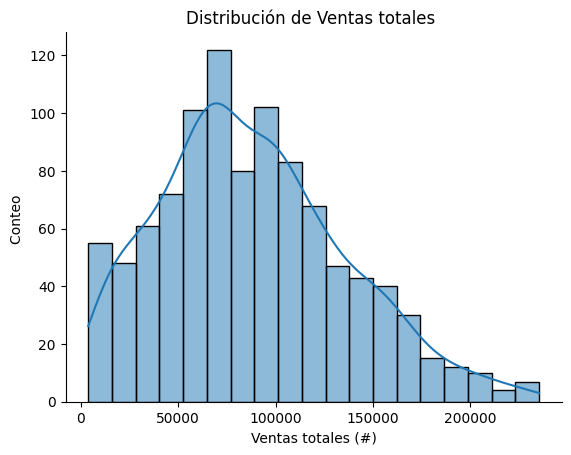

In [90]:
sns.histplot(productos_vendidos['ventas'], kde=True)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Distribución de Ventas totales ")
plt.xlabel("Ventas totales (#)")
plt.ylabel("Conteo ")

In [91]:
demandahistorica['ventaspreciopromedio']= demandahistorica['precio_promedio']*demandahistorica['ventas']

In [92]:
productos_vendidos_precio=demandahistorica.groupby('prod_id')['ventaspreciopromedio'].sum()
productos_vendidos_precio=productos_vendidos_precio.reset_index().sort_values(by='ventaspreciopromedio', ascending=False)
productos_vendidos_precio.head(10)

,prod_id,ventaspreciopromedio
239,239,1.864075e+09
786,786,1.757270e+09
278,278,1.749185e+09
380,380,1.676767e+09
3,3,1.663118e+09
197,197,1.585293e+09
149,149,1.527702e+09
348,348,1.510685e+09
13,13,1.497138e+09
343,343,1.466183e+09


Text(0, 0.5, 'Conteo')

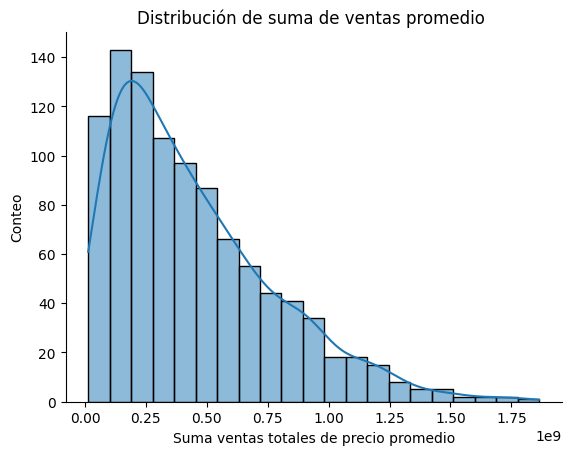

In [93]:
# Que producto es el que se vende más

sns.histplot(productos_vendidos_precio['ventaspreciopromedio'], kde=True)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Distribución de suma de ventas promedio ")
plt.xlabel("Suma ventas totales de precio promedio")
plt.ylabel("Conteo")

In [94]:
demandahistorica

,fecha,prod_id,precio_promedio,ventas,modelo_actual,año,añoymes,año_trimestre,ventaspreciopromedio
0,2017-01-01,0,6651.737920,1786.0,1943.551087,2017,2017-01,2017Q1,1.188000e+07
1,2017-02-01,0,4919.698602,2194.0,1853.111850,2017,2017-02,2017Q1,1.079382e+07
2,2017-03-01,0,3277.484704,1178.0,1659.733052,2017,2017-03,2017Q1,3.860877e+06
3,2017-04-01,0,5906.864332,1010.0,1580.492875,2017,2017-04,2017Q2,5.965933e+06
4,2017-05-01,0,4662.644018,1327.0,1552.062093,2017,2017-05,2017Q2,6.187329e+06
...,...,...,...,...,...,...,...,...,...
80743,2019-08-01,999,7187.188137,250.0,305.990296,2019,2019-08,2019Q3,1.796797e+06
80744,2019-09-01,999,7477.166036,303.0,288.024166,2019,2019-09,2019Q3,2.265581e+06
80745,2019-10-01,999,5129.561953,238.0,276.290378,2019,2019-10,2019Q4,1.220836e+06
80746,2019-11-01,999,4097.960475,213.0,261.017635,2019,2019-11,2019Q4,8.728656e+05


In [95]:
ventaspormes = demandahistorica.groupby('fecha')['ventas'].sum().reset_index()

fig = go.Figure()


fig.add_trace(go.Scatter(x=ventaspormes['fecha'], y=ventaspormes['ventas'],
                         mode='lines+markers',
                         line=dict(color='blue'),
                         marker=dict(symbol='circle', size=6),
                         name='Ventas'))


fig.update_layout(
    title='Ventas a lo largo del mes',
    xaxis_title='Fecha',
    yaxis_title='Ventas (#)',
    xaxis=dict(
        tickformat='%b %Y',
        dtick="M1",  
        tickangle=45,
        tickmode='auto'
    ),
    margin=dict(l=50, r=50, t=50, b=50),
    showlegend=False
)


fig.show()


In [96]:

x = demandahistorica['ventas']
y = demandahistorica['ventaspreciopromedio']

fig = ff.create_2d_density(x, y, colorscale='Blues')
fig.update_layout(
    title="Distribución Conjunta de Ventas y Precio Promedio",
    xaxis_title="Número de Ventas (#)",
    yaxis_title="Ganancia ($)",
    margin=dict(l=50, r=50, t=50, b=50)
)

fig.show()


La forma de los contornos sugiere que, en general, a medida que aumenta el número de ventas, la ganancia también tiende a aumentar. Sin embargo, parece que esta relación no es lineal ni homogénea. Los contornos se encuentran más concentrados cerca de valores bajos tanto para ventas como para ganancias.

Los contornos más cercanos al origen (cero en ambos ejes) indican que la mayor densidad de datos está en productos con menores ventas y menores ganancias por lo cual pueda indicar el recambio dentro del inventario que se observó previamente.

De manera general se puede observar que a medida que el número de ventas aumenta también la ganancia pero como se ve la distribución de las variables se puede pero hay algunos productos que logran aumentar sus ventas y generar ganancias más altas.
Algunos ejemplos claros son que el top 10 de productos vendidos no son el el top 10 que genera mayor ganancia.

### Análisis series de tiempo de los datos

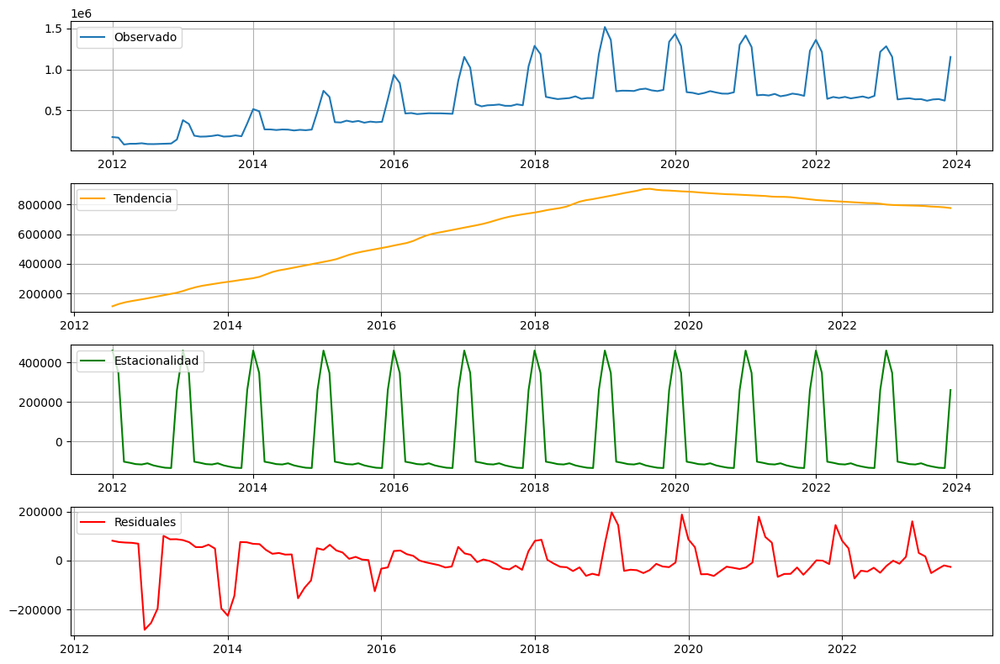

In [97]:

sales_series = ventaspormes.set_index('fecha')['ventas']
decomposition = seasonal_decompose(sales_series, model='additive', period=12)


plt.figure(figsize=(12, 8))


plt.subplot(4, 1, 1)
plt.plot(decomposition.observed, label='Observado')
plt.legend(loc='upper left')
plt.grid(True)


plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Tendencia', color='orange')
plt.legend(loc='upper left')
plt.grid(True)


plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Estacionalidad', color='green')
plt.legend(loc='upper left')
plt.grid(True)

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residuales', color='red')
plt.legend(loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()


In [98]:

observed_variance = np.var(decomposition.observed)
residual_variance = np.var(decomposition.resid.dropna())
seasonality_strength = 1 - (residual_variance / observed_variance)
seasonality_strength

np.float64(0.947634820275832)

#### Evaluación modelo actual

In [100]:
demandahistorica.to_csv('demandahistorica_procesada.csv',encoding='utf-8', index=False)